In [21]:
%config IPCompleter.greedy=True

In [4]:
%pip install librosa

Note: you may need to restart the kernel to use updated packages.


In [23]:
%pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [ ]:
!sudo apt update
!sudo apt install ffmpeg -y

找不到命令
找不到命令


NameError: name 'version' is not defined

In [28]:
%pip install ffmpeg-python

Note: you may need to restart the kernel to use updated packages.


In [1]:
import librosa
import librosa.display
import numpy as np
import pandas as pd
import ffmpeg as ff
import os
from typing import List, Tuple, Dict
import matplotlib.pyplot as plt
import random
import cv2
import pickle
import datetime

In [2]:
def extract_audio_from_video(file_path: str) -> np.ndarray:
    inputfile = ff.input(file_path)
    out = inputfile.output('-', format='f32le', acodec='pcm_f32le', ac=1, ar='44100')
    raw = out.run(capture_stdout=True)
    del inputfile, out
    return np.frombuffer(raw[0],np.float32)

In [3]:
def preprocess_audio_series(raw_data: np.ndarray) -> np.ndarray:
    N, M = 24, 1319
    # 使用关键字参数传递音频数据
    mfcc_data = librosa.feature.mfcc(y=raw_data, n_mfcc=24)
    
    # Standardizing MFCC (zero mean and unit variance)
    mfcc_data_standardized = (mfcc_data - np.mean(mfcc_data)) / np.std(mfcc_data)
    
    # Use pre-padding (Note: with 0, which is also the mean after standardization) to unify the length of the samples.
    number_of_columns_to_fill = M - mfcc_data_standardized.shape[1]
    padding = np.zeros((N, number_of_columns_to_fill))
    
    padded_data = np.hstack((padding, mfcc_data_standardized))
    
    # Reshaping to N,M,1
    return padded_data.reshape(N, M, 1)

In [4]:
def get_number_of_frames(file_path: str) -> int:
    probe = ff.probe(filePath)
    video_streams = [stream for stream in probe["streams"] if stream["codec_type"] == "video"]
    #width = video_streams[0]['coded_width']
    #height = video_streams[0]['coded_height']
    del probe
    return video_streams[0]['nb_frames']

In [5]:
def extract_N_video_frames(file_path: str, number_of_samples: int = 6) -> List[np.ndarray]:
    nb_frames = int(get_number_of_frames(file_path= filePath))
    
    video_frames = []
    random_indexes = random.sample(range(0, nb_frames), number_of_samples)
    
    cap = cv2.VideoCapture(filePath)
    for ind in random_indexes:
        cap.set(1,ind)
        res, frame = cap.read()
        video_frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    cap.release()
    del cap, random_indexes
    return video_frames

In [6]:
def resize_image(image: np.ndarray, new_size: Tuple[int,int]) -> np.ndarray:
    return cv2.resize(image, new_size, interpolation = cv2.INTER_AREA)

In [7]:
def crop_image_window(image: np.ndarray, training: bool = True) -> np.ndarray:
    height, width, _ = image.shape
    if training:
        MAX_N = height - 128
        MAX_M = width - 128
        rand_N_index, rand_M_index = random.randint(0, MAX_N) , random.randint(0, MAX_M)
        return image[rand_N_index:(rand_N_index+128),rand_M_index:(rand_M_index+128),:]
    else:
        N_index = (height - 128) // 2
        M_index = (width - 128) // 2
        return image[N_index:(N_index+128),M_index:(M_index+128),:]

In [8]:
def reading_label_data(file_name: str, dictionary: Dict[str,str]) -> np.ndarray:
    features = ['extraversion', 'neuroticism', 'agreeableness', 'conscientiousness', 'openness']
    extracted_data = [float(dictionary[label][file_name]) for label in features]
    return np.stack(extracted_data).reshape(5,1)

In [9]:
def preprocessing_input(file_path: str, file_name: str, dictionary: Dict[str,str], training: bool = True) -> Tuple[np.ndarray,np.ndarray,np.ndarray]:
    #Audio
    extracted_audio_raw = extract_audio_from_video(file_path= filePath)
    preprocessed_audio = preprocess_audio_series(raw_data= extracted_audio_raw)
    
    #Video
    sampled = extract_N_video_frames(file_path= filePath, number_of_samples= 6)
    resized_images = [resize_image(image= im, new_size= (248,140)) for im in sampled]
    cropped_images = [crop_image_window(image= resi,training= training) / 255.0 for resi in resized_images]
    preprocessed_video = np.stack(cropped_images)
    
    #Ground Truth
    video_gt = reading_label_data(file_name= file_name, dictionary= dictionary)
    del extracted_audio_raw, sampled, resized_images, cropped_images
    return (preprocessed_audio, preprocessed_video, video_gt)

### Getting train set

In [40]:
from tqdm import tqdm
import os
import pickle
import datetime

training_set_data = []
path = r"D:\529_group-main\helper"
gt = pickle.load(open(r"D:\529_group-main\helper\pkl/train-annotation/annotation_training.pkl", "rb"), encoding='latin1')
t1 = datetime.datetime.utcnow()

# 获取文件夹中的所有文件名
filenames = os.listdir(path)

# 调试：打印文件列表
print("文件列表:", filenames)

# 过滤只处理 .dat 文件
dat_extensions = ['.dat']
filenames = [f for f in filenames if os.path.splitext(f)[1].lower() in dat_extensions]

# 调试：打印过滤后的文件列表
print("过滤后的 .dat 文件列表:", filenames)

# 使用 tqdm 创建进度条
for filename in tqdm(filenames, desc='Processing files'):
    file_path = os.path.join(path, filename)
    print(f"处理文件: {file_path}")
    if os.path.exists(file_path):
        try:
            # 临时注释掉实际处理，打印调试信息
            print(f"模拟处理 {filename}，跳过实际调用")
            # training_set_data.append(preprocessing_input(file_path=file_path, file_name=filename, dictionary=gt, training=True))
            training_set_data.append(f"processed_{filename}")
        except Exception as e:
            print(f"处理 {filename} 时出错: {e}")
    else:
        print(f"文件不存在: {file_path}")

t2 = datetime.datetime.utcnow()
# 计算执行时间
print('执行时间: ' + str(t2 - t1))




文件列表: ['.env', 'best_model.keras', 'ChatGUI.py', 'convert.py', 'main.py', 'Personality_trait_prediction.ipynb', 'pip_requirement.txt', 'pkl', 'requirement.txt', 'requirements.txt', 'test_set.dat', 'training_set.dat', 'validation_set.dat', 'VoiceChatBot.py', '__pycache__']
过滤后的 .dat 文件列表: ['test_set.dat', 'training_set.dat', 'validation_set.dat']


Processing files: 100%|██████████| 3/3 [00:00<00:00, 2998.79it/s]

处理文件: D:\529_group-main\helper\test_set.dat
模拟处理 test_set.dat，跳过实际调用
处理文件: D:\529_group-main\helper\training_set.dat
模拟处理 training_set.dat，跳过实际调用
处理文件: D:\529_group-main\helper\validation_set.dat
模拟处理 validation_set.dat，跳过实际调用
执行时间: 0:00:00.002000


In [41]:
from tqdm import tqdm
import os
import pickle
import datetime

training_set_data = []
path = r"D:\529_group-main\helper"
gt = pickle.load(open(r"D:\529_group-main\helper\pkl/train-annotation/annotation_training.pkl", "rb"), encoding='latin1')
t1 = datetime.datetime.utcnow()

# 获取文件夹中的所有文件名
filenames = os.listdir(path)

# 使用 tqdm 创建进度条
for filename in tqdm(filenames, desc='Processing files'):
    filePath = os.path.join(path, filename)
    training_set_data.append(preprocessing_input(file_path=filePath, file_name=filename, dictionary=gt, training=True))

t2 = datetime.datetime.utcnow()
# 计算执行时间
print('Elapsed time: ' + str(t2 - t1))

Processing files:   0%|          | 0/15 [00:00<?, ?it/s]


Error: ffmpeg error (see stderr output for detail)

In [43]:
from tqdm import tqdm
import os
import pickle
import datetime

training_set_data = []
path = r"D:\529_group-main\helper"
gt = pickle.load(open(r"D:\529_group-main\helper\pkl/train-annotation/annotation_training.pkl", "rb"), encoding='latin1')
t1 = datetime.datetime.utcnow()

# 获取文件夹中的所有文件名
filenames = os.listdir(path)

# 使用 tqdm 创建进度条，并添加错误处理
for filename in tqdm(filenames, desc='Processing files'):
    filePath = os.path.join(path, filename)
    try:
        if os.path.isfile(filePath):
            print(f"Processing: {filePath}")
            training_set_data.append(preprocessing_input(file_path=filePath, file_name=filename, dictionary=gt, training=True))
        else:
            print(f"File not found or not a file: {filePath}")
    except Exception as e:
        print(f"Error processing {filename}: {str(e)}")

t2 = datetime.datetime.utcnow()
# 计算执行时间
print('Elapsed time: ' + str(t2 - t1))


Processing files:   7%|▋         | 1/15 [00:00<00:01,  7.34it/s]

Processing: D:\529_group-main\helper\.env
Error processing .env: ffmpeg error (see stderr output for detail)
Processing: D:\529_group-main\helper\best_model.keras
Error processing best_model.keras: ffmpeg error (see stderr output for detail)
Processing: D:\529_group-main\helper\ChatGUI.py


Processing files:  60%|██████    | 9/15 [00:00<00:00, 28.74it/s]

Error processing ChatGUI.py: ffmpeg error (see stderr output for detail)
Processing: D:\529_group-main\helper\convert.py
Error processing convert.py: ffmpeg error (see stderr output for detail)
Processing: D:\529_group-main\helper\main.py
Error processing main.py: ffmpeg error (see stderr output for detail)
Processing: D:\529_group-main\helper\Personality_trait_prediction.ipynb
Error processing Personality_trait_prediction.ipynb: ffmpeg error (see stderr output for detail)
Processing: D:\529_group-main\helper\pip_requirement.txt
Error processing pip_requirement.txt: ffmpeg error (see stderr output for detail)
File not found or not a file: D:\529_group-main\helper\pkl
Processing: D:\529_group-main\helper\requirement.txt
Error processing requirement.txt: ffmpeg error (see stderr output for detail)
Processing: D:\529_group-main\helper\requirements.txt
Error processing requirements.txt: ffmpeg error (see stderr output for detail)
Processing: D:\529_group-main\helper\test_set.dat
Error proc

Processing files: 100%|██████████| 15/15 [00:00<00:00, 27.01it/s]

Error processing training_set.dat: ffmpeg error (see stderr output for detail)
Processing: D:\529_group-main\helper\validation_set.dat
Error processing validation_set.dat: ffmpeg error (see stderr output for detail)
Processing: D:\529_group-main\helper\VoiceChatBot.py
Error processing VoiceChatBot.py: ffmpeg error (see stderr output for detail)
File not found or not a file: D:\529_group-main\helper\__pycache__
Elapsed time: 0:00:00.557332


In [46]:
def read_file_content(file_path, num_bytes=16):
    with open(file_path, 'rb') as f:
        content = f.read(num_bytes)
        print(f"First {num_bytes} bytes of {file_path}: {content.hex()}")

read_file_content(r"D:\529_group-main\helper\test_set.dat")
read_file_content(r"D:\529_group-main\helper\training_set.dat")
read_file_content(r"D:\529_group-main\helper\validation_set.dat")



First 16 bytes of D:\529_group-main\helper\test_set.dat: 80049589000000000000005d94288c15
First 16 bytes of D:\529_group-main\helper\training_set.dat: 80045d942e
First 16 bytes of D:\529_group-main\helper\validation_set.dat: 80049589000000000000005d94288c15


In [45]:
import pickle

def try_load_pickle(file_path):
    try:
        data = pickle.load(open(file_path, "rb"), encoding='latin1')
        print(f"Data loaded successfully from {file_path}: {type(data)}")
        return data
    except Exception as e:
        print(f"Error loading {file_path} with pickle: {str(e)}")
        return None

try_load_pickle(r"D:\529_group-main\helper\test_set.dat")
try_load_pickle(r"D:\529_group-main\helper\training_set.dat")
try_load_pickle(r"D:\529_group-main\helper\validation_set.dat")


Data loaded successfully from D:\529_group-main\helper\test_set.dat: <class 'list'>
Data loaded successfully from D:\529_group-main\helper\training_set.dat: <class 'list'>
Data loaded successfully from D:\529_group-main\helper\validation_set.dat: <class 'list'>


[(array([[[-5.23737621e+00],
          [-5.13854408e+00],
          [-5.35591555e+00],
          ...,
          [-4.35587406e+00],
          [-4.63583326e+00],
          [-5.55998421e+00]],
  
         [[ 2.30916929e+00],
          [ 2.46296453e+00],
          [ 2.47041464e+00],
          ...,
          [ 2.26197362e+00],
          [ 2.31426191e+00],
          [ 2.15759850e+00]],
  
         [[ 1.78170487e-01],
          [ 2.53331751e-01],
          [ 2.72920102e-01],
          ...,
          [ 4.94920403e-01],
          [ 6.16676331e-01],
          [ 8.55346739e-01]],
  
         ...,
  
         [[-1.74683839e-01],
          [-2.62992948e-01],
          [-1.84277520e-01],
          ...,
          [ 7.06282258e-02],
          [ 1.25584239e-02],
          [ 1.21565629e-03]],
  
         [[-2.08419245e-02],
          [-6.33924678e-02],
          [-4.44303006e-02],
          ...,
          [ 1.05271347e-01],
          [ 2.82166749e-02],
          [-2.52812691e-02]],
  
         [[ 4.6419

In [42]:
savename = "training_set.dat"
with open(savename, "wb") as f:
    pickle.dump(training_set_data, f)

### Getting validation set

In [20]:
validation_set_data = []
path = r"D:\529_group-main\helper"
gt = pickle.load(open(r"D:\529_group-main\helper\pkl/train-annotation/annotation_validation.pkl", "rb"), encoding='latin1')
t1 = datetime.datetime.utcnow()

# 获取文件夹中的所有文件名
filenames = os.listdir(path)

# 使用 tqdm 创建进度条
for filename in tqdm(filenames, desc='Processing files'):
    filePath = os.path.join(path, filename)
    validation_set_data.append(preprocessing_input(file_path=filePath, file_name=filename, dictionary=gt, training=True))

t2 = datetime.datetime.utcnow()
# 计算执行时间
print('Elapsed time: ' + str(t2 - t1))

Processing files:   0%|          | 0/15 [00:00<?, ?it/s]


Error: ffmpeg error (see stderr output for detail)

In [24]:
savename = "validation_set.dat"
with open(savename, "wb") as f:
    pickle.dump(validation_set_data, f)

### Getting test set

In [1]:
test_set_data = []
path = r"C:\Users\50597\Desktop\data - 副本\testall"
gt = pickle.load( open( r"C:\Users\50597\Desktop\data - 副本\pkl\test-annotation-e\annotation_test.pkl", "rb" ), encoding='latin1' )
t1 = datetime.datetime.utcnow()

filenames = os.listdir(path)

# 使用 tqdm 创建进度条
for filename in tqdm(filenames, desc='Processing files'):
    filePath = os.path.join(path, filename)
    test_set_data.append(preprocessing_input(file_path=filePath, file_name=filename, dictionary=gt, training=True))

t2 = datetime.datetime.utcnow()
# 计算执行时间
print('Elapsed time: ' + str(t2 - t1))

NameError: name 'pickle' is not defined

In [26]:
savename = "test_set.dat"
with open(savename, "wb") as f:
    pickle.dump(test_set_data, f)

### Restarting kernel to free up memory, and then load data

In [10]:
with open('training_set.dat', "rb") as training_file:
    train_set_data = pickle.load(training_file)

In [11]:
with open("validation_set.dat", "rb") as validation_file:
    validation_set_data = pickle.load(validation_file)

In [12]:
with open("test_set.dat", "rb") as test_file:
    test_set_data = pickle.load(test_file)

In [15]:
gt = pickle.load( open("annotation_training.pkl", "rb" ), encoding='latin1' )
neuroticism = list(gt['neuroticism'].values())
extraversion = list(gt['extraversion'].values())
agreeableness = list(gt['agreeableness'].values())
conscientiousness = list(gt['conscientiousness'].values())
openness = list(gt['openness'].values())

df = pd.DataFrame({'neuroticism': neuroticism,'extraversion': extraversion,'agreeableness':agreeableness,'conscientiousness':conscientiousness,'openness':openness})
df.plot(kind='density',xlim=(0,1))

FileNotFoundError: [Errno 2] No such file or directory: 'annotation_training.pkl'

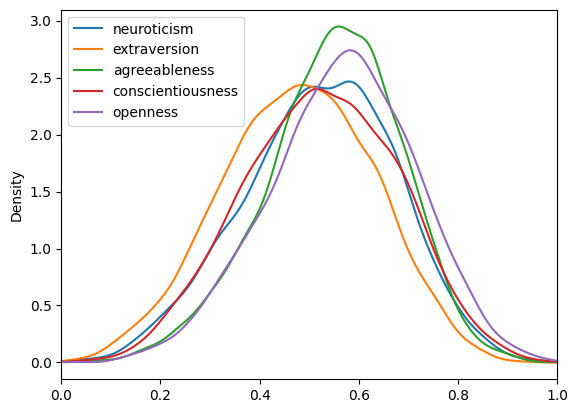

In [13]:
import pickle
import pandas as pd

# 使用绝对路径
file_path = r"D:\529_group-main\helper\pkl\train-annotation\annotation_training.pkl"
try:
    gt = pickle.load(open(file_path, "rb"), encoding='latin1')
    neuroticism = list(gt['neuroticism'].values())
    extraversion = list(gt['extraversion'].values())
    agreeableness = list(gt['agreeableness'].values())
    conscientiousness = list(gt['conscientiousness'].values())
    openness = list(gt['openness'].values())

    df = pd.DataFrame({
        'neuroticism': neuroticism,
        'extraversion': extraversion,
        'agreeableness': agreeableness,
        'conscientiousness': conscientiousness,
        'openness': openness
    })
    df.plot(kind='density', xlim=(0, 1))
except FileNotFoundError:
    print(f"File not found at: {file_path}")
except Exception as e:
    print(f"Error loading file: {str(e)}")


In [14]:
df

,neuroticism,extraversion,agreeableness,conscientiousness,openness
0,0.552083,0.523364,0.626374,0.601942,0.488889
1,0.375000,0.345794,0.472527,0.582524,0.366667
2,0.291667,0.252336,0.406593,0.485437,0.511111
3,0.489583,0.457944,0.505495,0.398058,0.377778
4,0.489583,0.607477,0.406593,0.621359,0.622222
...,...,...,...,...,...
5995,0.479167,0.523364,0.626374,0.621359,0.544444
5996,0.760417,0.728972,0.582418,0.524272,0.822222
5997,0.770833,0.700935,0.747253,0.699029,0.788889
5998,0.531250,0.317757,0.582418,0.679612,0.588889


### Plotting number of samples in each set

In [15]:
print(len(train_set_data))
print(len(validation_set_data))
print(len(test_set_data))

6000
2000
2000


In [16]:
train_random_index = random.randint(0, len(train_set_data)-1)
validation_random_index = random.randint(0, len(validation_set_data)-1)
test_random_index = random.randint(0, len(test_set_data)-1)

In [17]:
shape = train_set_data[train_random_index][0].shape
mfcc_train = train_set_data[train_random_index][0].reshape(shape[0],shape[1])

shape = validation_set_data[validation_random_index][0].shape
mfcc_validation = validation_set_data[validation_random_index][0].reshape(shape[0],shape[1])

shape = test_set_data[test_random_index][0].shape
mfcc_train = test_set_data[test_random_index][0].reshape(shape[0],shape[1])

mfccs = [mfcc_train,mfcc_validation,mfcc_train]

### Displaying 3 video samples from train,validation and test sets

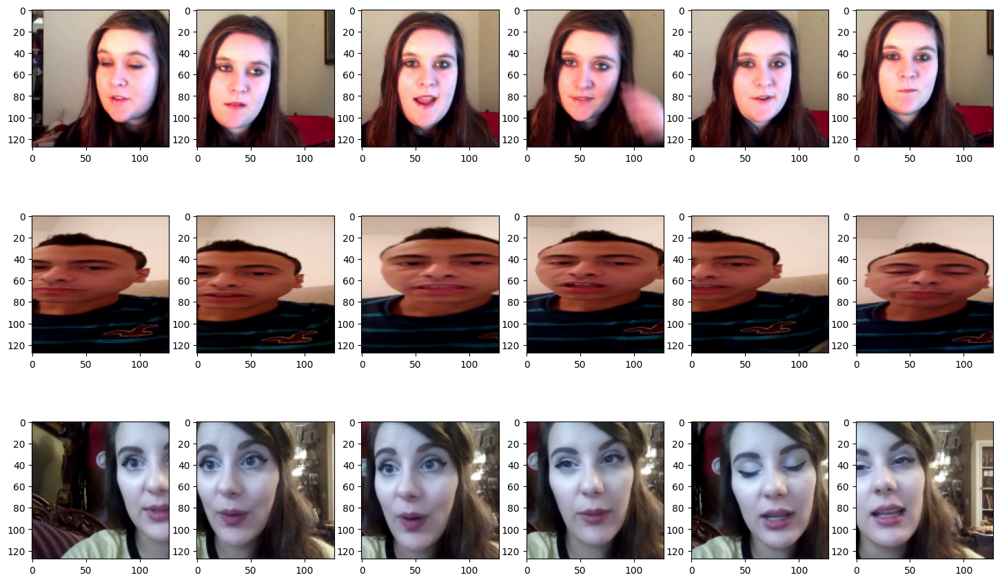

In [18]:
images_to_plot = []
images_to_plot.extend([(train_set_data[train_random_index][1])[i,:,:,:] for i in range(0,6)])
images_to_plot.extend([(validation_set_data[validation_random_index][1])[i,:,:,:] for i in range(0,6)])
images_to_plot.extend([(test_set_data[test_random_index][1])[i,:,:,:] for i in range(0,6)])
    

plt.figure(figsize=(18,11))

for i in range(18):
    plt.subplot(3,6,i+1)
    plt.imshow(images_to_plot[i])
plt.show()

### Displaying audio MFCC

In [43]:
librosa.display.specshow(mfccs[0], x_axis='time', y_axis='mel')

ImportError: Numba needs NumPy 1.24 or greater. Got NumPy 1.23.

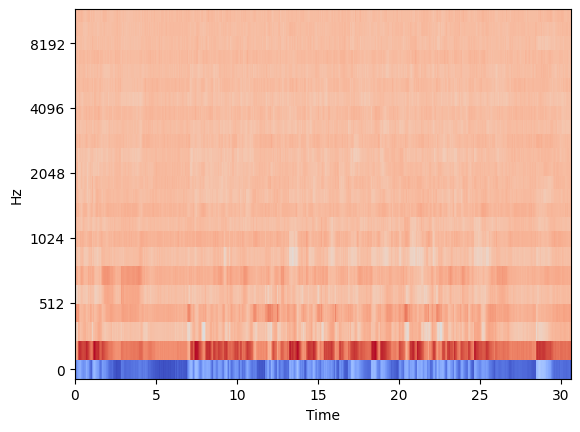

In [23]:
librosa.display.specshow(mfccs[1], x_axis='time', y_axis='mel')

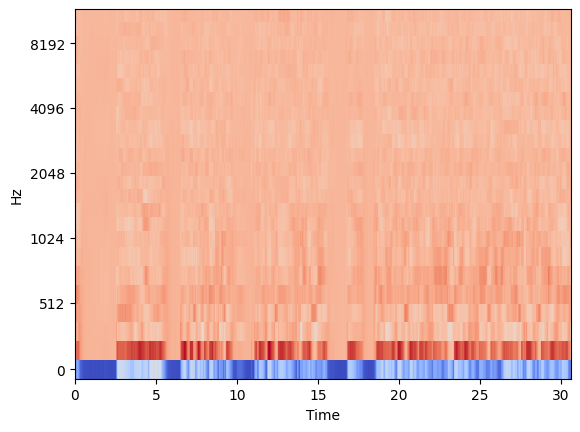

In [24]:
librosa.display.specshow(mfccs[2], x_axis='time', y_axis='mel')

### Printing personality traits

In [25]:
personality_train = train_set_data[train_random_index][2]
personality_validation = validation_set_data[validation_random_index][2]
personality_test = test_set_data[test_random_index][2]
personalities = ['Neuroticism','Extraversion','Agreeableness','Conscientiousness','Openness']

#### Train

In [26]:
for label, value in zip(personalities,personality_train):
    print(label + ': ' + str(value[0]))

NameError: name 'personalities' is not defined

#### Validation

In [27]:
for label, value in zip(personalities,personality_validation):
    print(label + ': ' + str(value[0]))

Neuroticism: 0.7009345794392524
Extraversion: 0.65625
Agreeableness: 0.5934065934065933
Conscientiousness: 0.7184466019417477
Openness: 0.7888888888888888


#### Test

In [28]:
for label, value in zip(personalities,personality_test):
    print(label + ': ' + str(value[0]))

Neuroticism: 0.5233644859813085
Extraversion: 0.5416666666666666
Agreeableness: 0.5384615384615384
Conscientiousness: 0.3300970873786408
Openness: 0.5


### Converting sets to model format

In [29]:
def reshape_to_expected_input(dataset: List[Tuple[np.ndarray,np.ndarray,np.ndarray]]) -> Tuple[np.ndarray,np.ndarray,np.ndarray]:
    
    x0_list = []
    x1_list = []
    y_list = []
    for i in range(0,len(dataset)):
        x0_list.append(dataset[i][0])
        x1_list.append(dataset[i][1])
        y_list.append(dataset[i][2])
    return (np.stack(x0_list),np.stack(x1_list),np.stack(y_list))

In [30]:
train_input = reshape_to_expected_input(dataset= train_set_data)
del train_set_data
validation_input = reshape_to_expected_input(dataset= validation_set_data)
del validation_set_data
test_input = reshape_to_expected_input(dataset= test_set_data)
del test_set_data

## Creating Model

In [31]:
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Flatten, Input, LSTM, Bidirectional, Lambda, Dropout, Concatenate
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import TimeDistributed

### Audio subnetwork

In [32]:
audio_input = Input(shape=(24,1319,1))
audio_model = Conv2D(32, kernel_size=(3,3),activation='relu')(audio_input)
audio_model = BatchNormalization()(audio_model)
audio_model = MaxPooling2D(pool_size=(2, 2))(audio_model)
audio_model = Conv2D(32, kernel_size=(3,3),activation='relu')(audio_model)
audio_model = BatchNormalization()(audio_model)
audio_model = MaxPooling2D(pool_size=(2, 2))(audio_model)
audio_model = Flatten()(audio_model)
audio_model = Dense(128, activation='relu')(audio_model)
audio_subnetwork = Model(inputs=audio_input,outputs=audio_model)

### Visual subnetwork

In [33]:
from keras.applications import vgg16

In [35]:
visual_model = Input(shape=(6,128,128,3))

cnn = vgg16.VGG16(weights="imagenet", include_top=False, pooling='max')
cnn.trainable = False

In [36]:
encoded_frame = TimeDistributed(Lambda(lambda x: cnn(x)))(visual_model)
encoded_vid = LSTM(64)(encoded_frame)

visual_subnetwork = Model(inputs=visual_model,outputs=encoded_vid)

In [37]:
combined = Concatenate()([audio_subnetwork.output, visual_subnetwork.output])
final1 = Dense(256, activation='relu')(combined)
final2 = Dense(5, activation='linear')(final1)

In [38]:
combined_network = Model(inputs=[audio_input, visual_model], outputs=final2)
combined_network.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 24, 1319,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 22, 1317,  │        320 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 22, 1317,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 11, 658,   │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 9, 656,    │      9,248 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 9, 656,    │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 4, 328,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_3       │ (None, 6, 128,    │          0 │ -                 │
│ (InputLayer)        │ 128, 3)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 41984)     │          0 │ max_pooling2d_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed    │ (None, 6, 512)    │          0 │ input_layer_3[0]… │
│ (TimeDistributed)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 128)       │  5,374,080 │ flatten[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm (LSTM)         │ (None, 64)        │    147,712 │ time_distributed… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 192)       │          0 │ dense[0][0],      │
│ (Concatenate)       │                   │            │ lstm[0][0]        │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 256)       │     49,408 │ concatenate[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 5)         │      1,285 │ dense_1[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 5,582,309 (21.29 MB)

 Trainable params: 5,582,181 (21.29 MB)

 Non-trainable params: 128 (512.00 B)

In [39]:
combined_network.compile(optimizer = 'adam',loss = 'mean_absolute_error',metrics=['mae'])

### Training

In [40]:
from keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(patience=10)

In [41]:
from keras.callbacks import ModelCheckpoint

# 定义保存最佳模型的回调函数
checkpoint = ModelCheckpoint(
    filepath='best_model.keras',  # 保存路径
    monitor='val_loss',         # 监控验证集损失
    save_best_only=True,        # 仅保存性能最佳的模型
    mode='min',                 # 损失越小越好
    verbose=1
)

In [29]:
import tensorflow as tf
print("TensorFlow version:", tf.__version__)
print("CUDA available:", tf.test.is_built_with_cuda())
print("GPU devices:", tf.config.list_physical_devices('GPU'))


TensorFlow version: 2.12.0
CUDA available: False
GPU devices: []


In [42]:
history = combined_network.fit(x = [train_input[0],train_input[1]],
                               y = train_input[2],
                               validation_data = ([validation_input[0],validation_input[1]],validation_input[2]),
                               epochs = 20,
                               verbose = 1,
                               callbacks = [early_stopping, checkpoint])

Epoch 1/20
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 962ms/step - loss: 1.6169 - mae: 1.6169
Epoch 1: val_loss improved from inf to 6.10697, saving model to best_model.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 250s 1s/step - loss: 1.6116 - mae: 1.6116 - val_loss: 6.1070 - val_mae: 6.1070
Epoch 2/20
 52/188 ━━━━━━━━━━━━━━━━━━━━ 2:13 978ms/step - loss: 0.1269 - mae: 0.1269

KeyboardInterrupt: 

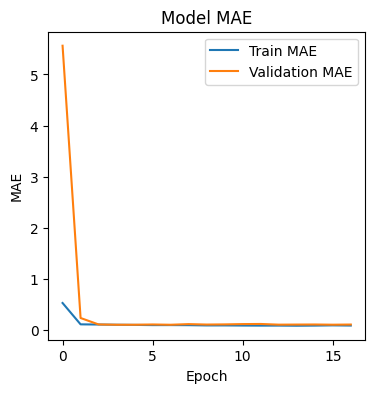

In [51]:
plt.figure(figsize=(9,4))

plt.subplot(1,2,1)
plt.plot(history.history['mae'])
plt.plot(history.history['val_mae'])
plt.title('Model MAE')
plt.ylabel('MAE')
plt.xlabel('Epoch')
plt.legend(['Train MAE', 'Validation MAE'], loc='upper right')

#### Evaluate model on train set

In [52]:
loss, mae = combined_network.evaluate([test_input[0],test_input[1]],test_input[2], verbose=0)

print('Test loss: {}'.format(loss))

Test loss: 0.1087961345911026


### 1-MAE

In [53]:
print('1-MAE: ' + str(1-mae))

1-MAE: 0.8912038654088974


In [54]:
one_minus_mae_train = [1-maee for maee in history.history['mae']]
one_minus_mae_val = [1-maee for maee in history.history['val_mae']]

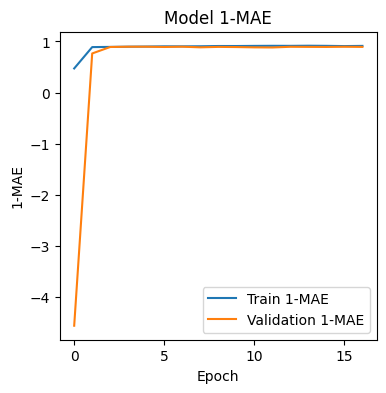

In [55]:
plt.figure(figsize=(9,4))

plt.subplot(1,2,1)
plt.plot(one_minus_mae_train)
plt.plot(one_minus_mae_val)
plt.title('Model 1-MAE')
plt.ylabel('1-MAE')
plt.xlabel('Epoch')
plt.legend(['Train 1-MAE', 'Validation 1-MAE'], loc='lower right')

### Coefficient of determination (R^2)

In [56]:
y_pred = combined_network.predict([test_input[0],test_input[1]])
pred_shape = y_pred.shape
y_pred = y_pred.reshape(pred_shape[0],pred_shape[1],1)

63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step


In [57]:
normalized = y_pred / np.max(y_pred)

Text(0.5, 0, 'Y_pred_Neuroticism')

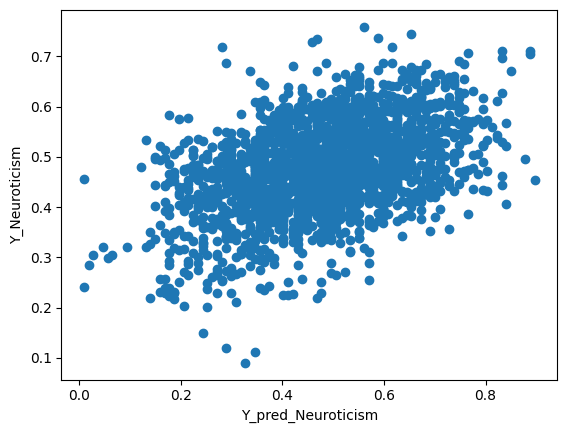

In [58]:
plt.scatter(test_input[2][:,0,:], normalized[:,0,:], marker='o');
plt.ylabel('Y_Neuroticism')
plt.xlabel('Y_pred_Neuroticism')

#### Coefficient Determination (R^2)

In [59]:
from sklearn.metrics import r2_score

In [60]:
pers = ['Neuroticism','Extraversion','Agreeableness','Conscientiousness','Openness']
r2s = [r2_score(test_input[2][:,i,:], normalized[:,i,:]) for i in range(5)]
for pers, r2 in zip(pers,r2s):
    print(pers + ': ' + str(r2))

Neuroticism: 0.18424635253631738
Extraversion: -0.013845751028852327
Agreeableness: -0.25084300759235045
Conscientiousness: -0.02713517553119038
Openness: 0.15220040067635254
